<a href="https://colab.research.google.com/github/amisq987/uber/blob/main/Uber2014EDA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [70]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


**1. Tiền xử lí dữ liệu**

1.1. Khai báo các thư viện cần thiết

In [71]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import matplotlib.cm as cm
import plotly.express as px

1.2. Kết nối dữ liệu

In [72]:
uber_apr14=pd.read_csv('/content/drive/MyDrive/link data uber/uber-raw-data-apr14.csv')
uber_may14=pd.read_csv('/content/drive/MyDrive/link data uber/uber-raw-data-may14.csv')
uber_jun14=pd.read_csv('/content/drive/MyDrive/link data uber/uber-raw-data-jun14.csv')
uber_jul14=pd.read_csv('/content/drive/MyDrive/link data uber/uber-raw-data-jul14.csv')
uber_aug14=pd.read_csv('/content/drive/MyDrive/link data uber/uber-raw-data-aug14.csv')
uber_sep14=pd.read_csv('/content/drive/MyDrive/link data uber/uber-raw-data-sep14.csv')

In [73]:
uber = pd.concat([uber_apr14, uber_may14, uber_jun14, uber_jul14, uber_aug14, uber_sep14], ignore_index=True)

1.3. Xử lí các giá trị bị thiếu

In [74]:
uber.isnull().sum()

,0
Date/Time,0
Lat,0
Lon,0
Base,0


1.4. Xử lí các giá trị bị trùng lập

In [75]:
uber.duplicated().sum()

np.int64(82581)

In [76]:
uber.duplicated().sum()

np.int64(82581)

In [77]:
uber.duplicated().sum()

np.int64(82581)

1.5. Xử lí dự liệu thời gian thời gian

ta thấy dữ liệu thời gian đang ở dịnh dạng object nên cần thay đổi định dạng dữ liệu thời gian và thêm các cột biểu diễn ngày, giờ, phút để thuận tiện hơn trong quá trình phân tích

In [78]:
uber.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4534327 entries, 0 to 4534326
Data columns (total 4 columns):
 #   Column     Dtype  
---  ------     -----  
 0   Date/Time  object 
 1   Lat        float64
 2   Lon        float64
 3   Base       object 
dtypes: float64(2), object(2)
memory usage: 138.4+ MB


In [79]:
#Đổi tên cột Date/Time thành Date_time
uber.rename(columns={'Date/Time':'Date_time'},inplace=True)

#Chuyển đổi loại dữ liệu thời gian cho cột Date_time
uber['Date_time'] = pd.to_datetime(uber['Date_time'])

#Tạo thêm các cột cho thời gian
uber['month'] = uber['Date_time'].dt.month
uber['weekday'] = uber['Date_time'].dt.day_name()
uber['day'] = uber['Date_time'].dt.day
uber['hour'] = uber['Date_time'].dt.hour
uber['minute'] = uber['Date_time'].dt.minute

In [80]:
uber.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4534327 entries, 0 to 4534326
Data columns (total 9 columns):
 #   Column     Dtype         
---  ------     -----         
 0   Date_time  datetime64[ns]
 1   Lat        float64       
 2   Lon        float64       
 3   Base       object        
 4   month      int32         
 5   weekday    object        
 6   day        int32         
 7   hour       int32         
 8   minute     int32         
dtypes: datetime64[ns](1), float64(2), int32(4), object(2)
memory usage: 242.2+ MB


In [81]:
uber.head(5)

,Date_time,Lat,Lon,Base,month,weekday,day,hour,minute
0,2014-04-01 00:11:00,40.7690,-73.9549,B02512,4,Tuesday,1,0,11
1,2014-04-01 00:17:00,40.7267,-74.0345,B02512,4,Tuesday,1,0,17
2,2014-04-01 00:21:00,40.7316,-73.9873,B02512,4,Tuesday,1,0,21
3,2014-04-01 00:28:00,40.7588,-73.9776,B02512,4,Tuesday,1,0,28
4,2014-04-01 00:33:00,40.7594,-73.9722,B02512,4,Tuesday,1,0,33


In [82]:
print(uber['Date_time'].min())
print(uber['Date_time'].max())

2014-04-01 00:00:00
2014-09-30 22:59:00


In [83]:
uber.to_csv('uber_processed.csv', index=False)

**2. Phân tích khám phá (EDA)**

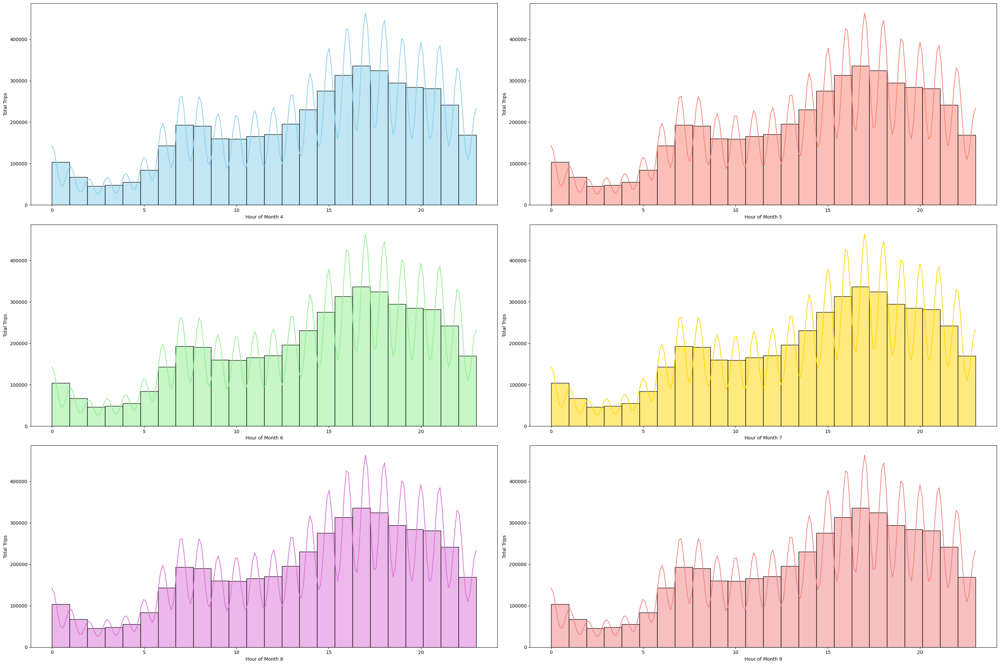

In [86]:
# Analyze trips by hour across different months
plt.figure(figsize=(30, 20))
colors = ['skyblue', 'salmon', 'lightgreen', 'gold', 'orchid', 'lightcoral']

for i, month in enumerate(uber['month'].unique()):
    plt.subplot(3, 2, i + 1)
    sns.histplot(data=uber, x="hour", bins=24, kde=True, color=colors[i % len(colors)])
    plt.xlabel('Hour of Month {}'.format(month))
    plt.ylabel('Total Trips')

plt.tight_layout()
plt.show()

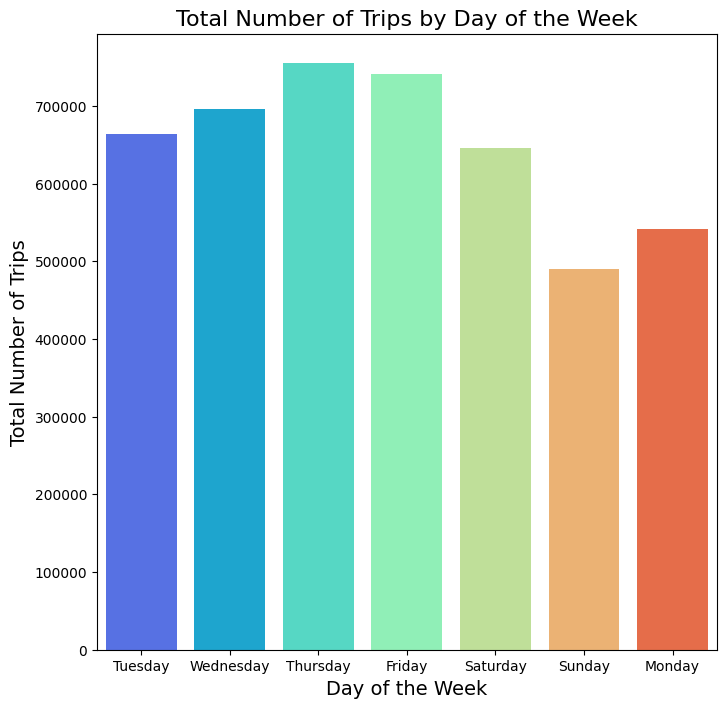

In [84]:
# Plot the total trips by day of the week
plt.figure(figsize=(8,8))
sns.countplot(data=uber, x="weekday", hue="weekday", palette="rainbow", legend=False)

# Add title and axis labels
plt.title("Total Number of Trips by Day of the Week", fontsize=16)
plt.xlabel("Day of the Week", fontsize=14)
plt.ylabel("Total Number of Trips", fontsize=14)

# Show the plot
plt.show()

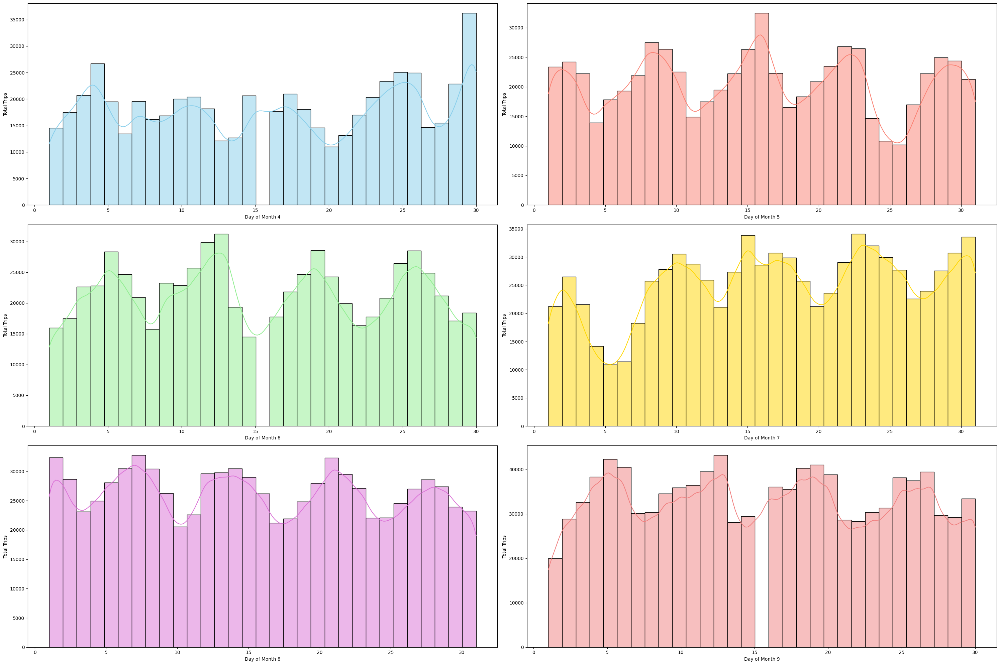

In [87]:
# Analyze total trips by day across different months
plt.figure(figsize=(30, 20))
colors = ['skyblue', 'salmon', 'lightgreen', 'gold', 'orchid', 'lightcoral']

for i, month in enumerate(uber['month'].unique()):
    plt.subplot(3, 2, i + 1)
    sns.histplot(data=uber, x=uber[uber['month'] == month]['day'], bins=31, kde=True, color=colors[i % len(colors)])
    plt.xlabel('Day of Month {}'.format(month))
    plt.ylabel('Total Trips')

plt.tight_layout()
plt.show()

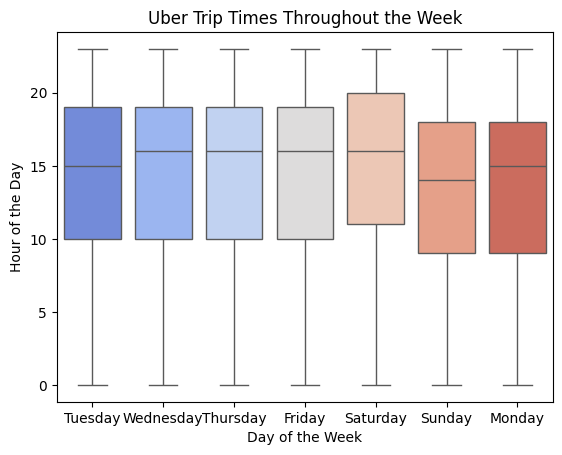

In [85]:
# Box plot analyzing Uber trip times throughout the week
sns.boxplot(x='weekday', y='hour', data=uber, hue='weekday', palette='coolwarm', legend=False)
plt.title("Uber Trip Times Throughout the Week")
plt.xlabel("Day of the Week")
plt.ylabel("Hour of the Day")
plt.show()

In [103]:
#Total driving hours per day in the month
uber.groupby('day')['hour'].count()

,hour
day,
1,127430
2,143201
3,142983
4,140923
5,147054
6,139886
7,143503
8,145984
9,155135


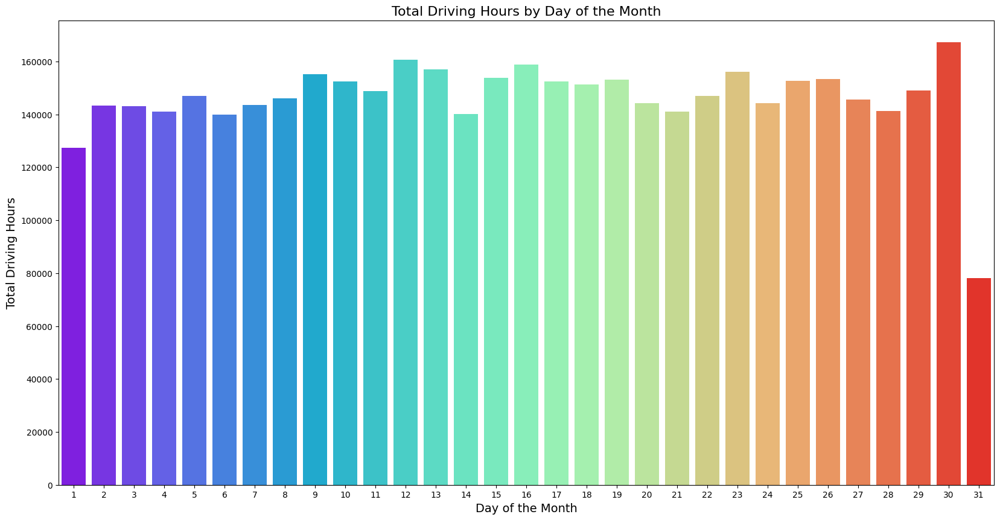

In [104]:
# Analyze total driving hours by day of the month
day_hours = uber.groupby('day')['hour'].count().reset_index(name='Total Driving Hours')

# Use a new colormap
cmap = plt.colormaps['rainbow']

# Create a list of colors from the colormap
colors = [cmap(i / len(day_hours)) for i in range(len(day_hours))]

# Plot a bar chart with vibrant colors
plt.figure(figsize=(20, 10))
bars = sns.barplot(x='day', y='Total Driving Hours', hue='day', data=day_hours, palette=colors, legend=False)

# Add title and axis labels
plt.title("Total Driving Hours by Day of the Month", fontsize=16)
plt.xlabel("Day of the Month", fontsize=14)
plt.ylabel("Total Driving Hours", fontsize=14)

# Show the plot
plt.show()

In [88]:
#Analyzes which month has the highest total number of trip hours
uber.groupby('month')['hour'].count()

,hour
month,
4,564516
5,652435
6,663844
7,796121
8,829275
9,1028136


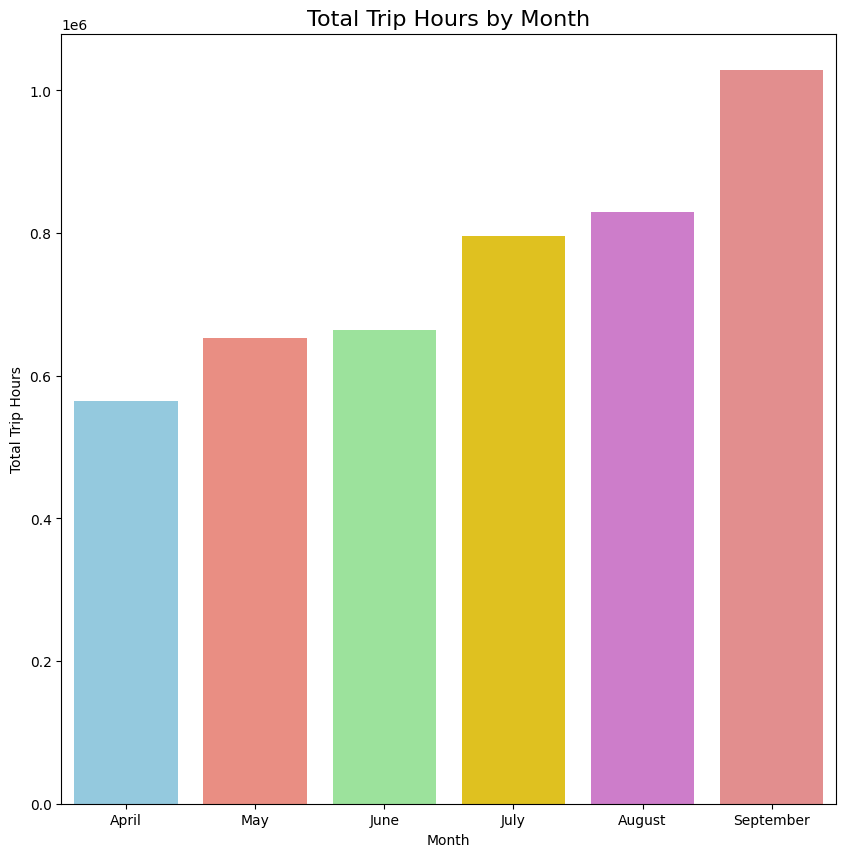

In [89]:
monthly_trips = uber.groupby('month')['hour'].count().reset_index(name='Total Trip Hours')
colors = ['skyblue', 'salmon', 'lightgreen', 'gold', 'orchid', 'lightcoral']

plt.figure(figsize=(10, 10))
sns.barplot(data=monthly_trips, x='month', y='Total Trip Hours', hue='month', palette=colors, legend=False)
plt.xticks(ticks=[0,1,2,3,4,5], labels=['April', 'May', 'June', 'July', 'August', 'September'])
plt.xlabel('Month')
plt.title("Total Trip Hours by Month", fontsize=16)
plt.show()

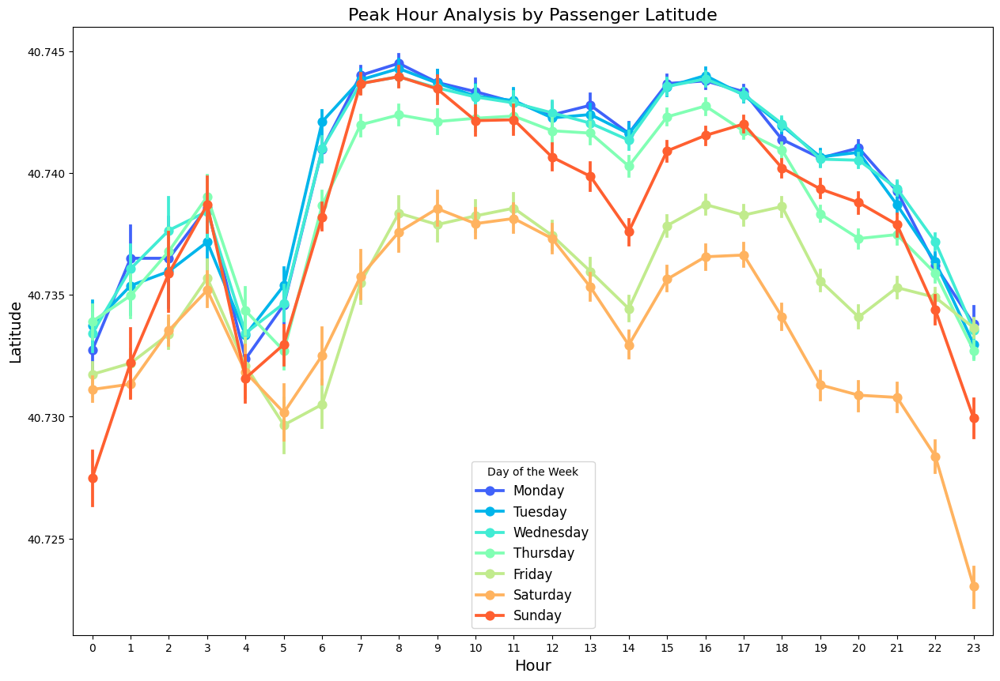

In [92]:
days = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]

# Plot the graph
plt.figure(figsize=(15, 10))
sns.pointplot(data=uber, x='hour', y='Lat', hue='weekday', palette="rainbow")

# Set the title (translated to English)
plt.title("Peak Hour Analysis by Passenger Latitude", fontsize=16)

# Automatically get handles and labels to preserve colors
handles, labels = plt.gca().get_legend_handles_labels()

# Add legend with weekday labels and keep colors consistent
plt.legend(handles=handles, labels=days, title="Day of the Week", fontsize=12)
plt.xlabel("Hour", fontsize=14)
plt.ylabel("Latitude", fontsize=14)

# Show the plot
plt.show()

In [94]:
uber['Base'].nunique()

5

In [93]:
#analyzes which locations (bases) have the highest total number of trips by hour
base = uber.groupby(['Base','hour'])['Date_time'].count().reset_index()
base

,Base,hour,Date_time
0,B02512,0,3598
1,B02512,1,2149
2,B02512,2,1466
3,B02512,3,1582
4,B02512,4,1815
...,...,...,...
115,B02764,19,17842
116,B02764,20,16510
117,B02764,21,15649
118,B02764,22,13540


In [95]:
fig4=px.scatter(base,
            x='hour',
            y='Date_time',
            color='Base',
            template='plotly_dark',
            color_discrete_sequence=['#50F9F1','#6AE5A8','#96C96A','#B7AA47','#C78845'])
fig4.update_layout(title_text='Total Trips by Location and Time of Day', title_x=0.5)


fig4.update_xaxes(title_text="Hour")
fig4.update_yaxes(title_text="Total Trips")

fig4.show()

In [105]:
#Geospatial analysis to understand taxi demand
Demand=(uber.groupby(['Lat','Lon']).count()['Date_time']).reset_index()
Demand.columns=['Latitude','Longitude','Number of Trips']
import folium as fo
from folium.plugins import HeatMap
base1=fo.Map()
HeatMap(Demand,zoom=20,radius=15).add_to(base1)
base1

In [96]:
#Heatmap
def count_rows(row):
    return len(row)


def heatmap(col1,col2):
    by_cross = uber.groupby([col1,col2]).size().unstack()
    plt.figure(figsize=(12,8))
    sns.heatmap(by_cross, cmap="coolwarm")

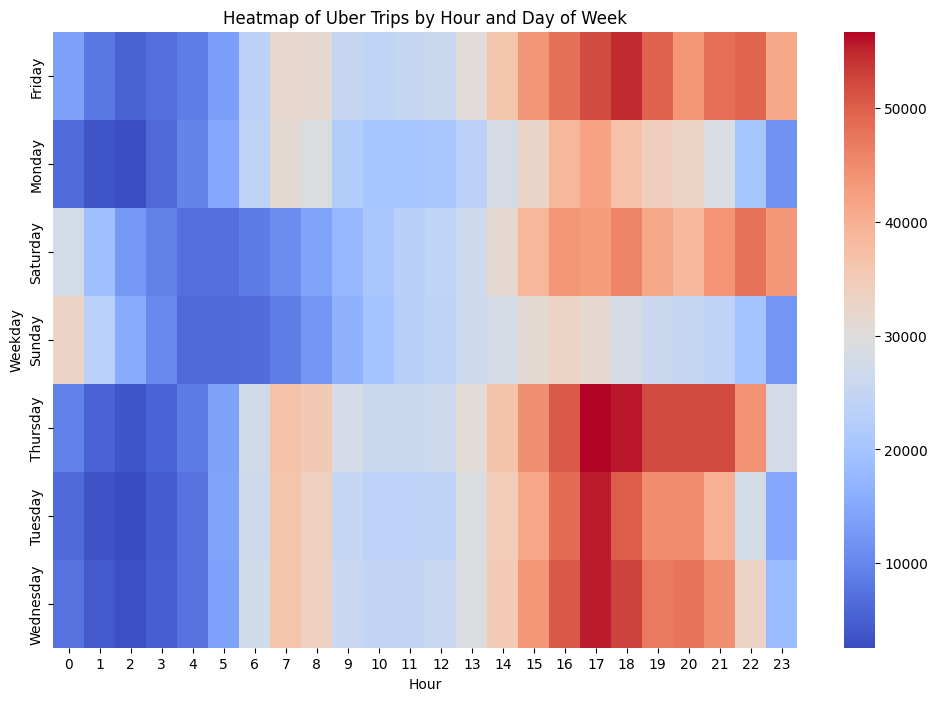

In [97]:
#By hour and day of the week
heatmap('weekday', 'hour')
plt.xlabel('Hour')
plt.ylabel('Weekday')
plt.title('Heatmap of Uber Trips by Hour and Day of Week')
plt.show()

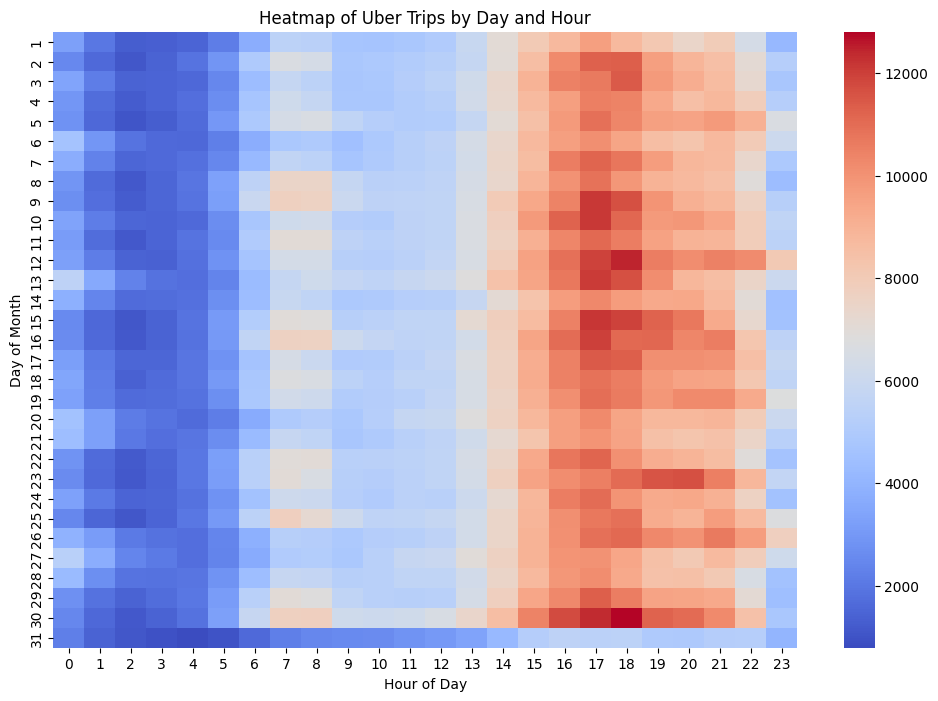

In [98]:
#by Day and Hour of the month
heatmap('day', 'hour')
plt.xlabel('Hour of Day')
plt.ylabel('Day of Month')
plt.title('Heatmap of Uber Trips by Day and Hour')
plt.show()

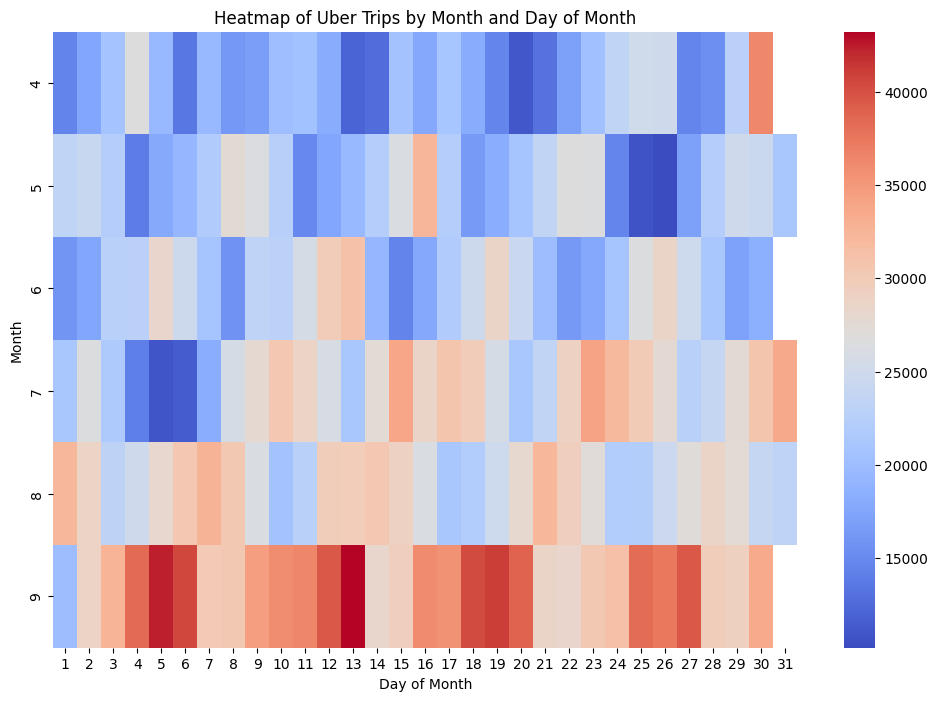

In [99]:
#by month and day of the month
heatmap('month', 'day')
plt.xlabel('Day of Month')
plt.ylabel('Month')
plt.title('Heatmap of Uber Trips by Month and Day of Month')
plt.show()

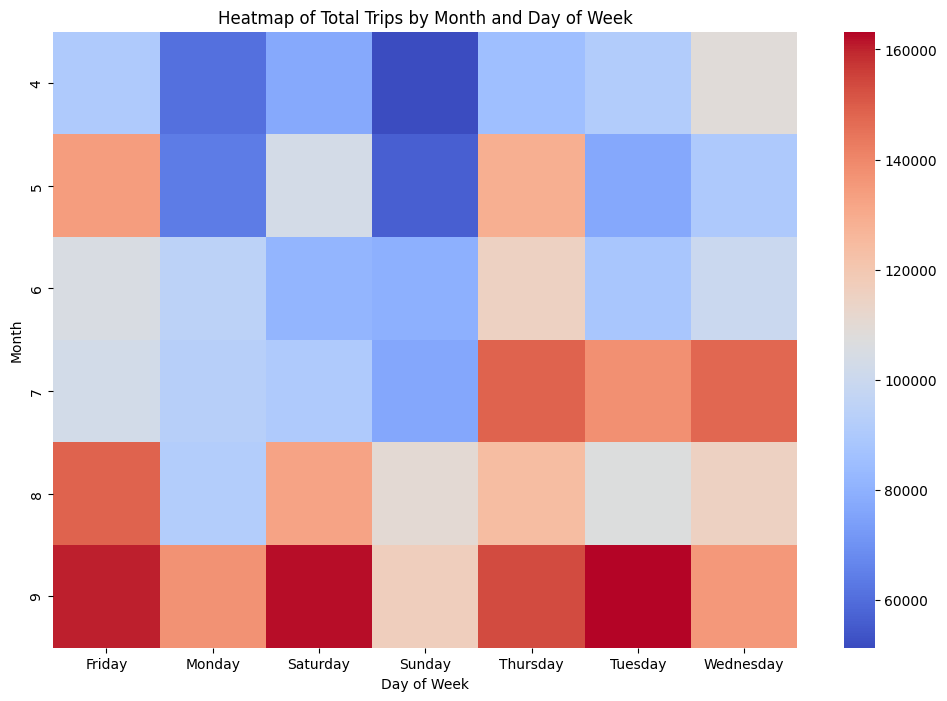

In [100]:
#by month and weekday
heatmap('month', 'weekday')
plt.xlabel('Day of Week')
plt.ylabel('Month')
plt.title('Heatmap of Total Trips by Month and Day of Week')
plt.show()